# TrixiParticles: A Julia Simulation package
#### Alan, Ishita, Patrick, Jesse

## **Outline**
1. What is SPH & TrixiParticles?
2. Motivation
4. Experiment 1: 2D Pipe Flow
5. Experiment 2: Taylor–Green Vortex
6. Experiment 3: 2d + 3d Dam Break
7. Conclusion

### What is TrixiParticles?

* TrixiParticles is a Julia library that implements Smoothed Particle Hydrodynamics (SPH)
* It is a mesh-free method for solving fluid and solid PDEs
* TrixiParticles supports
  * WCSPH (Weakly Compressible SPH)
  * EDAC-SPH (Entropically Damped Artificial Compressibility)
  * TLSPH (Total Lagrangian SPH)
  * IISPH/ISPH (Incompressible formulations)
  * DEM (Discrete Element Method)

### What is SPH?

SPH is a mesh free Lagrangian method:
* The domain is represented by intepolation particles, not grids
* Particles move with the flow which naturally handles:
  * large deformations
  * free surfaces
  * fluid jets
  * splashing/fragmentation


Each particle acts an 'interpolant' of the fluid being modelled, and thus each has:
* Position  
* Velocity  
* Density  
* Mass  
* Pressure  
* Stress/strain (for solids)
* Note: this includes boundary walls, which are often modeled as 'ghost particles' with particular qualities 

Derivation from physics principles, using only one non-trival (to us) identity: AN INTRODUCTION TO SPH, Monaghan
- Impulse field (dirac delta) -> Integral approximation using kernel -> Mulitply/Divide by density -> convert to mass -> use identity -> Solve for pressure force and combine with other forces (usually gravity) -> closed form equation for acceleration -> and then it sets up second-order ODE system with acceleration and velocity, and does this for each particle, for each time step
  
physical quantities are computed by:
$ A(x)= \sum_j A_j \, W(x - x_j, h)$
Where:
* $W$ is the smoothing kernel  
* $h$ is the smoothing length  
* The sum is over nearby particles

Gradients and Laplacians are also computed through kernel derivatives. This yields a discretized form of the Navier–Stokes equations.

### Motivation

Why did we choose SPH?

* It is a numerical discretization of PDEs  
* Relates back to many of our course topics:
  * Discretization error  
  * Stability (CFL, stiffness, blow-up)
  * Conditioning (kernel smoothness, particle spacing)
  * Time-stepping (explicit ODE solvers)
  * Convergence analysis  

### Experiment 1: Pipe Flow

2D Pipe Flow is a benchmark problem in fluid dynamics where a viscous fluid flows through a long, straight channel

We model incompressible flow using the Navier–Stokes equations:

$u_t + (u \cdot \nabla)u = -\frac{1}{\rho}\nabla p + \nu \nabla^2 u$

$\nabla \cdot u = 0$

Features:
* Rectangular domain: long channel with top & bottom walls  
* Inflow boundary on the left  
* Outflow boundary on the right  
* Walls enforce no slip conditions
* Goal: reach a steady-state velocity profile resembling a Poiseuille parabola



![Pipe Flow Diagram](PipeFlow/Lam_vs_turb.jpg)

In [2]:
import Pkg
Pkg.add("TrixiParticles")
Pkg.add("OrdinaryDiffEq")
using TrixiParticles

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.11/Project.toml`
  No Changes to `~/.julia/environments/v1.11/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.11/Project.toml`
  No Changes to `~/.julia/environments/v1.11/Manifest.toml`


[ Info: You just called `trixi_include`. Julia may now compile the code, please be patient.



████████╗██████╗ ██╗██╗  ██╗██╗██████╗  █████╗ ██████╗ ████████╗██╗ ██████╗██╗     ███████╗███████╗
╚══██╔══╝██╔══██╗██║╚██╗██╔╝██║██╔══██╗██╔══██╗██╔══██╗╚══██╔══╝██║██╔════╝██║     ██╔════╝██╔════╝
   ██║   ██████╔╝██║ ╚███╔╝ ██║██████╔╝███████║██████╔╝   ██║   ██║██║     ██║     █████╗  ███████╗
   ██║   ██╔══██╗██║ ██╔██╗ ██║██╔═══╝ ██╔══██║██╔══██╗   ██║   ██║██║     ██║     ██╔══╝  ╚════██║
   ██║   ██║  ██║██║██╔╝ ██╗██║██║     ██║  ██║██║  ██║   ██║   ██║╚██████╗███████╗███████╗███████║
   ╚═╝   ╚═╝  ╚═╝╚═╝╚═╝  ╚═╝╚═╝╚═╝     ╚═╝  ╚═╝╚═╝  ╚═╝   ╚═╝   ╚═╝ ╚═════╝╚══════╝╚══════╝╚══════╝


┌──────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Semidiscretization                                                                               │
│ ══════════════════                                                                               │
│ #spatial dimensions: ………………………… 2                                                           

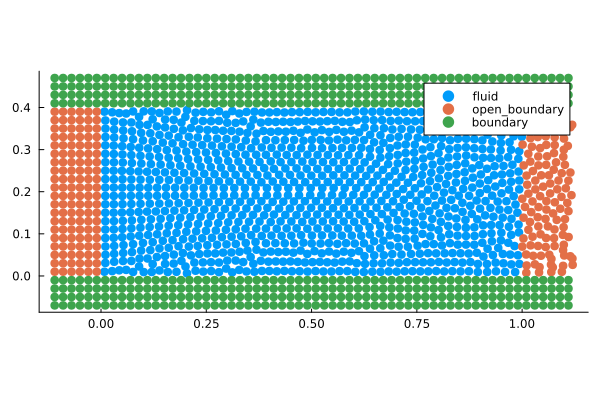

In [3]:
trixi_include(joinpath(examples_dir(), "fluid", "pipe_flow_2d.jl"))
using Plots
Plots.plot(sol)

In [4]:
include("PipeFlow/pipe_flow_2d.jl")

run_pipe_flow (generic function with 6 methods)


████████╗██████╗ ██╗██╗  ██╗██╗██████╗  █████╗ ██████╗ ████████╗██╗ ██████╗██╗     ███████╗███████╗
╚══██╔══╝██╔══██╗██║╚██╗██╔╝██║██╔══██╗██╔══██╗██╔══██╗╚══██╔══╝██║██╔════╝██║     ██╔════╝██╔════╝
   ██║   ██████╔╝██║ ╚███╔╝ ██║██████╔╝███████║██████╔╝   ██║   ██║██║     ██║     █████╗  ███████╗
   ██║   ██╔══██╗██║ ██╔██╗ ██║██╔═══╝ ██╔══██║██╔══██╗   ██║   ██║██║     ██║     ██╔══╝  ╚════██║
   ██║   ██║  ██║██║██╔╝ ██╗██║██║     ██║  ██║██║  ██║   ██║   ██║╚██████╗███████╗███████╗███████║
   ╚═╝   ╚═╝  ╚═╝╚═╝╚═╝  ╚═╝╚═╝╚═╝     ╚═╝  ╚═╝╚═╝  ╚═╝   ╚═╝   ╚═╝ ╚═════╝╚══════╝╚══════╝╚══════╝


┌──────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Semidiscretization                                                                               │
│ ══════════════════                                                                               │
│ #spatial dimensions: ………………………… 2                                                           

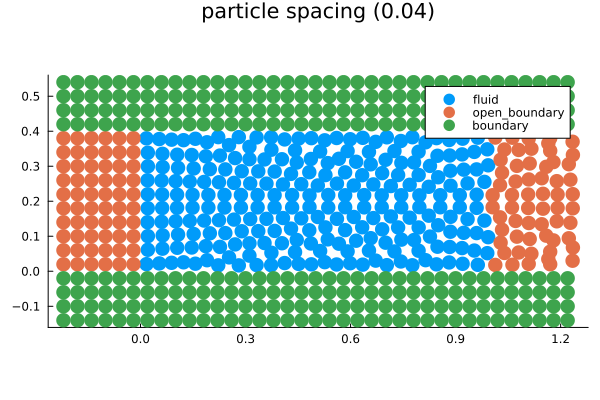

┌ Info: The desired fluid length in x-direction 1.0 is not a multiple of the particle spacing 0.03.
│ New fluid length in x-direction is set to 0.99.
└ @ TrixiParticles /Users/ishita/.julia/packages/TrixiParticles/sCTsM/src/setups/rectangular_tank.jl:195
┌ Info: The desired fluid length in y-direction 0.4 is not a multiple of the particle spacing 0.03.
│ New fluid length in y-direction is set to 0.39.
└ @ TrixiParticles /Users/ishita/.julia/packages/TrixiParticles/sCTsM/src/setups/rectangular_tank.jl:195
Excessive output truncated after 524541 bytes.


████████╗██████╗ ██╗██╗  ██╗██╗██████╗  █████╗ ██████╗ ████████╗██╗ ██████╗██╗     ███████╗███████╗
╚══██╔══╝██╔══██╗██║╚██╗██╔╝██║██╔══██╗██╔══██╗██╔══██╗╚══██╔══╝██║██╔════╝██║     ██╔════╝██╔════╝
   ██║   ██████╔╝██║ ╚███╔╝ ██║██████╔╝███████║██████╔╝   ██║   ██║██║     ██║     █████╗  ███████╗
   ██║   ██╔══██╗██║ ██╔██╗ ██║██╔═══╝ ██╔══██║██╔══██╗   ██║   ██║██║     ██║     ██╔══╝  ╚════██║
   ██║   ██║  ██║██║██╔╝ ██╗██║██║     ██║  ██║██║  ██║   ██║   ██║╚██████╗███████╗███████╗███████║
   ╚═╝   ╚═╝  ╚═╝╚═╝╚═╝  ╚═╝╚═╝╚═╝     ╚═╝  ╚═╝╚═╝  ╚═╝   ╚═╝   ╚═╝ ╚═════╝╚══════╝╚══════╝╚══════╝


┌──────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Semidiscretization                                                                               │
│ ══════════════════                                                                               │
│ #spatial dimensions: ………………………… 2                                                           

┌ Info: The desired fluid length in y-direction 0.4 is not a multiple of the particle spacing 0.03.
│ New fluid length in y-direction is set to 0.39.
└ @ TrixiParticles /Users/ishita/.julia/packages/TrixiParticles/sCTsM/src/setups/rectangular_tank.jl:195
┌ Info: The desired fluid length in y-direction 0.4 is not a multiple of the particle spacing 0.03.
│ New fluid length in y-direction is set to 0.39.
└ @ TrixiParticles /Users/ishita/.julia/packages/TrixiParticles/sCTsM/src/setups/rectangular_tank.jl:195


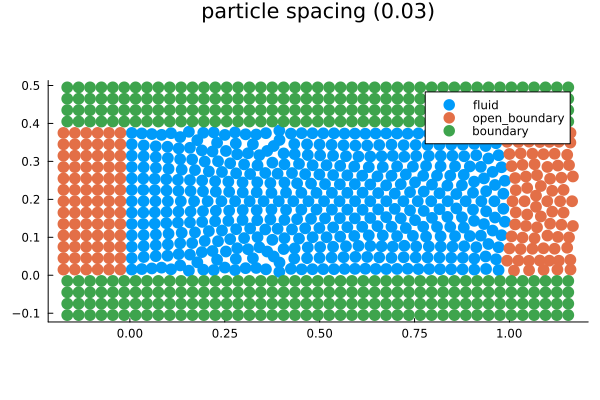

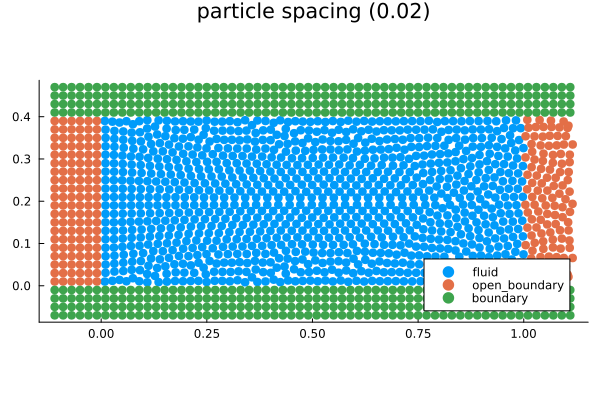

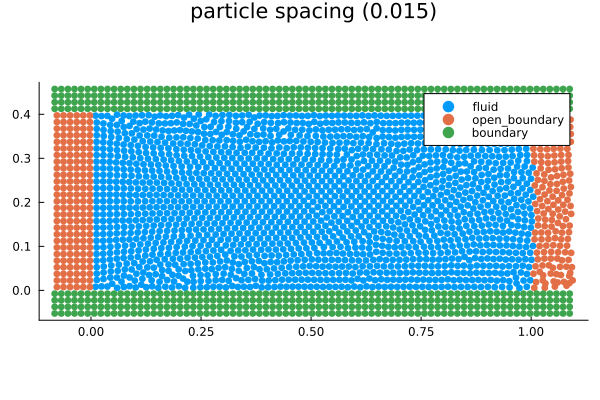

In [13]:
using Plots

hs = [0.04, 0.03, 0.02, 0.015]

for h in hs
    result = run_pipe_flow(h)

    global semi, fluid_system, open_boundary, boundary_system
    semi = result.semi
    fluid_system = result.fluid_system
    open_boundary = result.open_boundary
    boundary_system = result.boundary_system

    plt = Plots.plot(result.sol, title="particle spacing ($h)")
    display(plt)
end

#### Analysis
* Coarse resolution (h = 0.04) is noisy with uneven flow
    * Fluid particles show visible clumping and disorder
    * Wall boundary layers seem jagged
    * At coarse resolution we see discretization error. The SPH kernel under samples neighbors and as such we get inaccurate gradients resulting in noisy flow
* As h decreases the particles begin to arrange more smoothly
    * Between h = 0.03 and h = 0.02
        * The fluid region becomes more uniform
        * Noise decreases
        * The boundary walls become less jagged
    * With more particles, each kernel interaction gets more support points and so SPH consistency improves
* Best resolution (h = 0.015)
    * Highly uniform fluid particle distribution
    * Visibly less noise
    * The flow looks physically smooth

As particle spacing decreased the flow field became smoother and more physically accurate. This demonstrates spatial convergence of the SPH method and highlights the dependence of solutions quality on the sampling density.


████████╗██████╗ ██╗██╗  ██╗██╗██████╗  █████╗ ██████╗ ████████╗██╗ ██████╗██╗     ███████╗███████╗
╚══██╔══╝██╔══██╗██║╚██╗██╔╝██║██╔══██╗██╔══██╗██╔══██╗╚══██╔══╝██║██╔════╝██║     ██╔════╝██╔════╝
   ██║   ██████╔╝██║ ╚███╔╝ ██║██████╔╝███████║██████╔╝   ██║   ██║██║     ██║     █████╗  ███████╗
   ██║   ██╔══██╗██║ ██╔██╗ ██║██╔═══╝ ██╔══██║██╔══██╗   ██║   ██║██║     ██║     ██╔══╝  ╚════██║
   ██║   ██║  ██║██║██╔╝ ██╗██║██║     ██║  ██║██║  ██║   ██║   ██║╚██████╗███████╗███████╗███████║
   ╚═╝   ╚═╝  ╚═╝╚═╝╚═╝  ╚═╝╚═╝╚═╝     ╚═╝  ╚═╝╚═╝  ╚═╝   ╚═╝   ╚═╝ ╚═════╝╚══════╝╚══════╝╚══════╝


┌──────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Semidiscretization                                                                               │
│ ══════════════════                                                                               │
│ #spatial dimensions: ………………………… 2                                                           

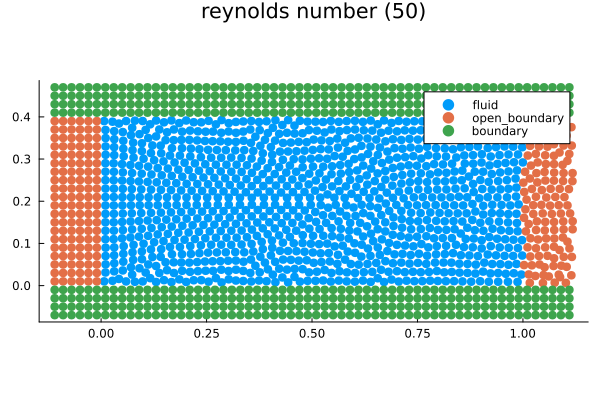

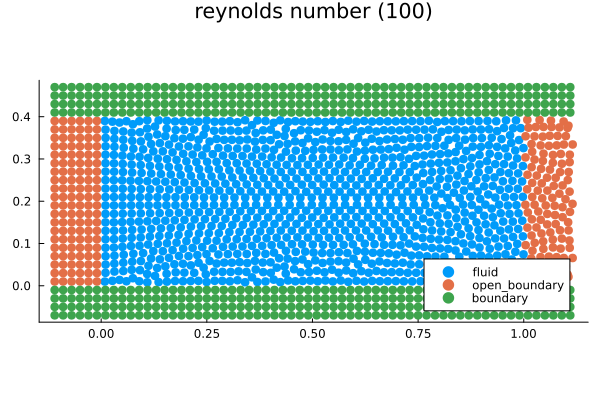

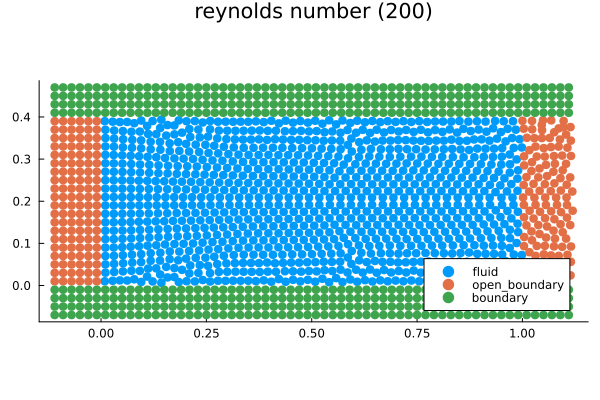

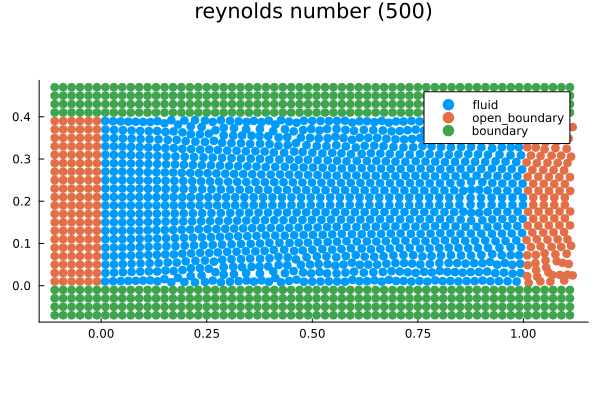

In [12]:
using Plots

hs = [50, 100, 200, 500]

for h in hs
    result = run_pipe_flow(0.02, h)

    global semi, fluid_system, open_boundary, boundary_system
    semi = result.semi
    fluid_system = result.fluid_system
    open_boundary = result.open_boundary
    boundary_system = result.boundary_system

    plt = Plots.plot(result.sol, title="reynolds number ($h)")
    display(plt)
end

#### Analysis

* RN = 50 shows a smooth and viscous flow
    * High viscosity seems to dampen SPH noise and smooth velocity gradients
* RN = 100 is mildly smooth but still laminar
    * Less viscous damping means that small instabilities become present
* RN = 200 shows visible sharpening
    * Flow in the center speeds up noticeably
    * Viscosity still stabilizes this flow but mcuch less than before
* RN = 500
    * More particle noise
    * Outer regions look very unstable
* So we can see from these parameters that viscosity dampens noise and that as RN increases, we see larger particle disorder. The outflow also becomes less stable. This is a known WCSPH issue for weakly viscous flows. 

Varying the Reynolds number controls the viscosity of the fluid. The experiment shows that SPH solutions become less stable and more noisy at high Reynolds numbers. This is consistent with both the physics and the numerical characteristics of WCSPH.

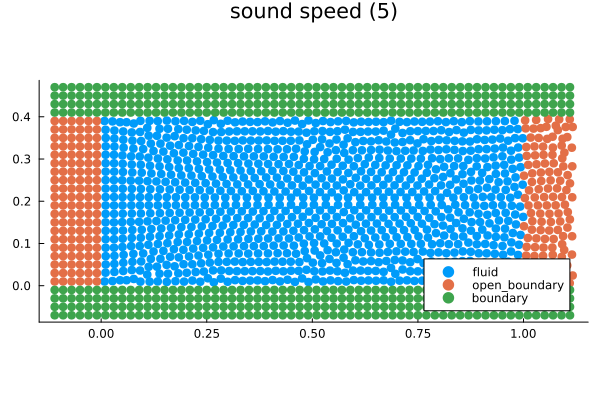

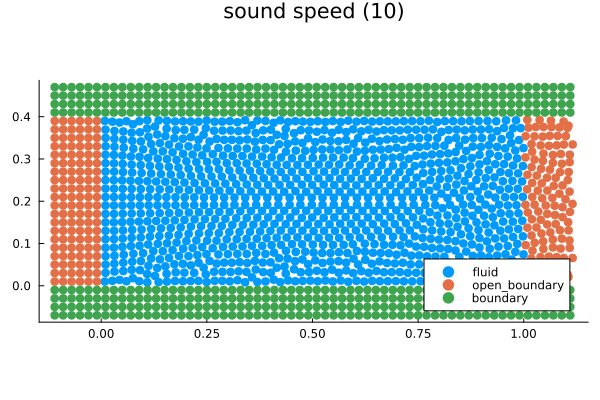

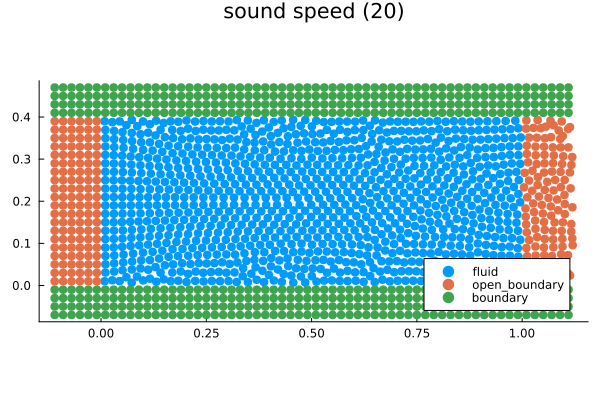

In [17]:
using Plots

hs = [5, 10, 20]

for h in hs
    result = run_pipe_flow(0.02, 100, h)

    global semi, fluid_system, open_boundary, boundary_system
    semi = result.semi
    fluid_system = result.fluid_system
    open_boundary = result.open_boundary
    boundary_system = result.boundary_system

    plt = Plots.plot(result.sol, title="sound speed ($h)")
    display(plt)
end

#### Analysis

* SS = 5 is most noisy
    * With low sound_speed the fluid is too compressible which is in actually physically unrealistic because real water is nearly incompressible.
* SS = 10
    * Particle distribution is more uniform
    * Recommended factor for weakly compressible SPH.
* SS = 20
    * approaches the incompressible limit for WCSPH
    * Simulation becomes more expensive


Reducing the sound speed increases compressibility errors and destabilizes the WCSPH method. Larger sound speeds improve accuracy but requires smaller timesteps which in turn increases computational cost.

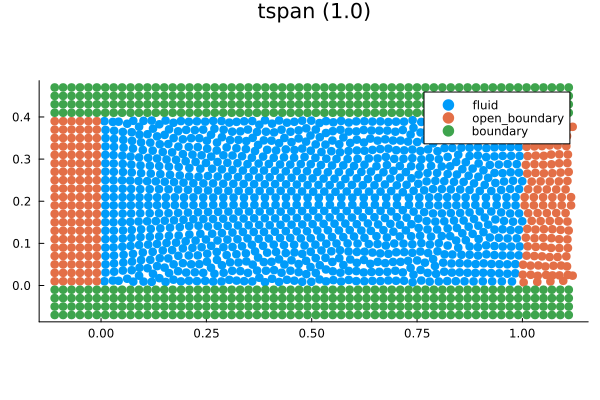

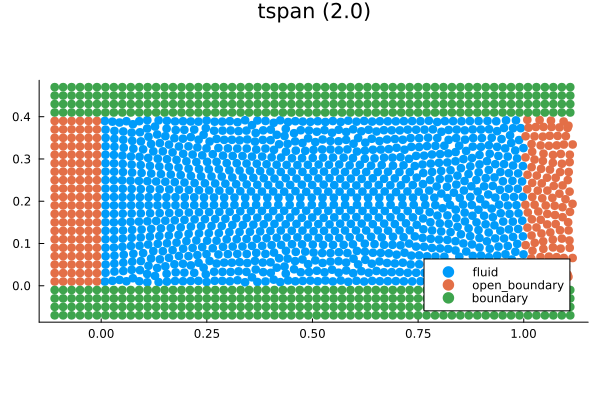

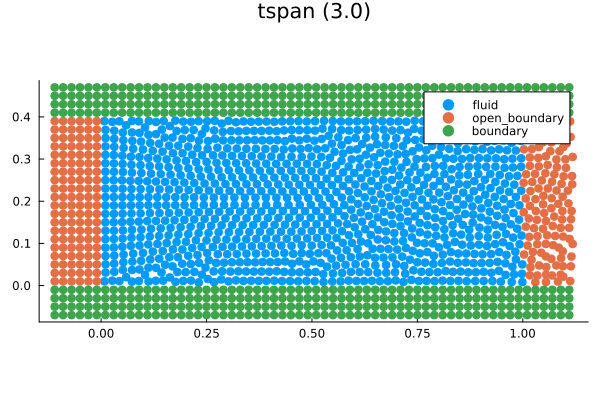

In [16]:
using Plots

hs = [1.0, 2.0, 3.0]

for h in hs
    result = run_pipe_flow(0.02, 100, 10, h)

    global semi, fluid_system, open_boundary, boundary_system
    semi = result.semi
    fluid_system = result.fluid_system
    open_boundary = result.open_boundary
    boundary_system = result.boundary_system

    plt = Plots.plot(result.sol, title="tspan ($h)")
    display(plt)
end

### Analysis
* tspan = 1.0
    * Irregularity in the center and near the outflow
* tspan = 2.0
    * The inflow-outflow interaction has had time to settle
* tspan = 3.0
    * Flow is essentially steady. The solution isn’t changing much anymore except near the boundaries

The simulation time was varied in order to determine how long the pipe flow needs to run before reaching a steady state. From our three experiments, we can tell that we must run long enough to let transient decay occur, but running far beyond the steady state mainly increases cost and could potentially allow accumulated numerical errors to grow.

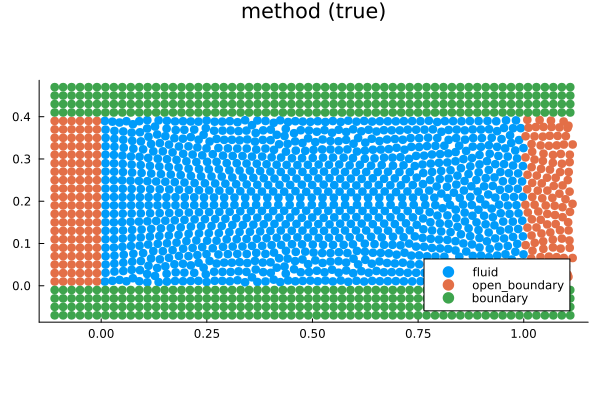

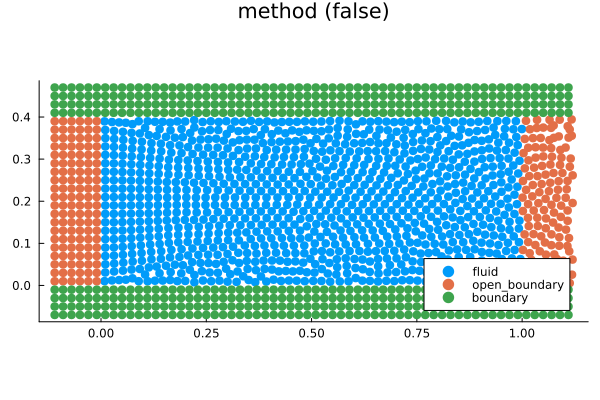

In [18]:
using Plots

hs = [true, false]

for h in hs
    result = run_pipe_flow(0.02, 100, 10, 2.0, h)

    global semi, fluid_system, open_boundary, boundary_system
    semi = result.semi
    fluid_system = result.fluid_system
    open_boundary = result.open_boundary
    boundary_system = result.boundary_system

    plt = Plots.plot(result.sol, title="method ($h)")
    display(plt)
end

#### Analysis

This compares two methods
* WCSPH: Weakly Compressible SPH
    * Flow is mostly smooth
    * Some noise in the center region
    * WCSPH always has some compressibility noise
* EDAC: Entropically Damped Artificial Compressibility
    * Less noise in center
    * More uniform density
    * Introduces an additional pressure evolution equation that damps pressure oscillations

The WCSPH method produces a generally correct flow field but shows pressure driven noise throughout the flow. This comes from WCSPH’s weakly compressible formula, where small density errors translate into pressure fluctuations. Using EDAC instead reduces this noise. The EDAC pressure equation adds an extra term that smooths pressure without increasing fluid viscosity. Overall, EDAC seems to yield a visibly more stable solution.

### Experiment 2: Taylor Green Vortex

#### Background
What is the Taylor Green Vortex? And why is it in so many fluid simulations?

To start off, Taylor Green Vortex (TGV) is an unsteady flow of a decaying vortex and has an exact closed form solution to the Navier-Stokes equations in Cartesian coordinates ([Wikipedia](https://en.wikipedia.org/wiki/Taylor%E2%80%93Green_vortex)). TGV is often found in many fluid simulations as it acts as an important benchmark case for validating and verifying computational fluid dynamics (CFD). ([Pereira et al., 2021](https://journals.aps.org/prfluids/abstract/10.1103/PhysRevFluids.6.054611))

According to wikipedia, in the orginal works of Taylor and Green, back in 1937, they examined flow with velocity $\bold{v} = (u, v, w)$ with three components (relating back to 3D) and modeled it with these equations: $$u = A\cos{(ax)}\sin{(by)}\sin{(cz)},\\
v = B\sin{(ax)}\cos{(by)}\sin{(cz)},\\
w = C\sin{(ax)}\sin{(by)}\cos{(cz)}$$

Then the time behavior would be found through a simplification of the incompressible Navier-Stokes equations (which you can read more [here](https://en.wikipedia.org/wiki/Navier%E2%80%93Stokes_equations#Incompressible_flow))

The TGV solution (in 2D) in the domain from $0 \leq x, y \leq 2\pi$ is given by the velocity vector $\bold{v} = (u,v)$: $$u = \sin{(x)}\cos{(y)}F(t), \\
v=-\cos{(x)}\sin{(y)}F(t)$$ where $F(t) = e^{-2\nu t}$, $\nu$ (lower-case *nu* and different from $v$) being the kinematic viscosity of the fluid.

The pressure function is also given by substituting the velocity solution into the momentum equations of the Navier-Stokes eqs.: $$p = \frac{\rho}{4}(\cos{(2x)}+\cos{(2y)})F^2(t)$$

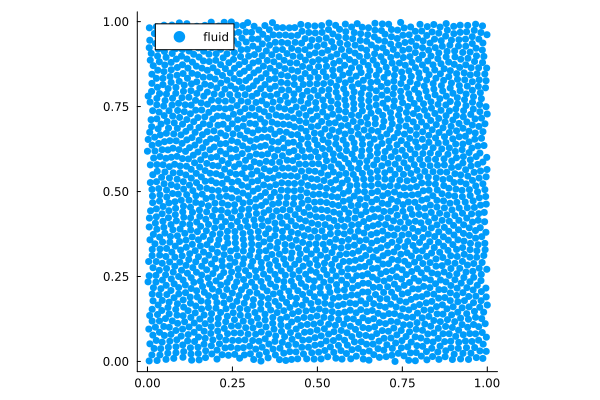

In [20]:
trixi_include(joinpath(examples_dir(), "fluid", "taylor_green_vortex_2d.jl"))
using Plots; plot(sol)

Let us visualize what is happening in this process.

In [28]:
using IJulia

# Display the video inline
IJulia.display("text/html", """
<video width="640" height="532" autoplay loop controls>
  <source src="TaylorGreenVortex/mp4_files/taylor_green_animation.mp4" type="video/mp4">
</video>
""")


While it is a little trippy, we can see that there some points that would be similar to a vortex (hence, the name taylor green vortex). So let us look at the velocity of the simulation.

The magnitude of the velocity is shown in the figure below. The figure is shown with a black and white color coding.

In [29]:
IJulia.display("text/html", """
<video width="640" height="532" autoplay loop controls>
  <source src="TaylorGreenVortex/mp4_files/taylor_green_velocity_bw.mp4" type="video/mp4">
</video>
""")

Let's also look a little bit at how pressure is spread throughout the vortex

In [30]:
# Pressure
IJulia.display("text/html", """
<video width="532" height="532" autoplay loop controls>
  <source src="TaylorGreenVortex/mp4_files/tgv_ed_pressure.mp4" type="video/mp4">
</video>
""")

#### Taylor Green Vortex w/WCSPH
What if for this section, we tried using a Weakly Compressible SPH system instead? What would the output look like instead? (Side note: the original taylor green vortex simualtion used a Entropically Damped SPH system)

In [8]:
# With wcsph
include("TaylorGreenVortex/taylor_green_vortex_2d.jl")


████████╗██████╗ ██╗██╗  ██╗██╗██████╗  █████╗ ██████╗ ████████╗██╗ ██████╗██╗     ███████╗███████╗
╚══██╔══╝██╔══██╗██║╚██╗██╔╝██║██╔══██╗██╔══██╗██╔══██╗╚══██╔══╝██║██╔════╝██║     ██╔════╝██╔════╝
   ██║   ██████╔╝██║ ╚███╔╝ ██║██████╔╝███████║██████╔╝   ██║   ██║██║     ██║     █████╗  ███████╗
   ██║   ██╔══██╗██║ ██╔██╗ ██║██╔═══╝ ██╔══██║██╔══██╗   ██║   ██║██║     ██║     ██╔══╝  ╚════██║
   ██║   ██║  ██║██║██╔╝ ██╗██║██║     ██║  ██║██║  ██║   ██║   ██║╚██████╗███████╗███████╗███████║
   ╚═╝   ╚═╝  ╚═╝╚═╝╚═╝  ╚═╝╚═╝╚═╝     ╚═╝  ╚═╝╚═╝  ╚═╝   ╚═╝   ╚═╝ ╚═════╝╚══════╝╚══════╝╚══════╝


┌──────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Semidiscretization                                                                               │
│ ══════════════════                                                                               │
│ #spatial dimensions: ………………………… 2                                                           

retcode: Success
Interpolation: 1st order linear
t: 2-element Vector{Float64}:
 0.0
 5.0
u: 2-element Vector{RecursiveArrayTools.ArrayPartition{Float64, Tuple{TrixiParticles.ThreadedBroadcastArray{Float64, 1, Vector{Float64}, PolyesterBackend}, TrixiParticles.ThreadedBroadcastArray{Float64, 1, Vector{Float64}, PolyesterBackend}}}}:
 ([-0.05521663800066436, 0.04126841893587401, 1.0, -0.0678261646187658, 0.19677406943316303, 1.0, -0.04472460630489965, 0.32841863149111705, 1.0, -0.06906786778857318  …  1.0, 0.08388271288553283, -0.29601262826762637, 1.0, 0.038928190082865195, -0.19598320709030878, 1.0, 0.068731682394938, -0.04737047720771559, 1.0], [0.006580000000000001, 0.0088, 0.031599999999999996, 0.01102, 0.053320000000000006, 0.00754, 0.07216, 0.012240000000000001, 0.09136, 0.00734  …  0.9063, 0.99188, 0.9309200000000001, 0.9913, 0.95198, 0.986, 0.96858, 0.99368, 0.99244, 0.98904])
 ([0.000583846876580426, -0.0009646937031647768, 1.0178833820522077, 0.00014749085545962118, -0.0005462

Let's do the same and look at the solid animation, velocity, and pressure of TGV under WCSPH.

In [31]:
# Solid Animation
IJulia.display("text/html", """
<video width="532" height="532" autoplay loop controls>
  <source src="TaylorGreenVortex/mp4_files/tgv_wc_solid.mp4" type="video/mp4">
</video>
""")

In [32]:
# Velocity
IJulia.display("text/html", """
<video width="532" height="532" autoplay loop controls>
  <source src="TaylorGreenVortex/mp4_files/tgv_wc_velocity.mp4" type="video/mp4">
</video>
""")

In [33]:
# Pressure
IJulia.display("text/html", """
<video width="532" height="532" autoplay loop controls>
  <source src="TaylorGreenVortex/mp4_files/tgv_wc_pressure.mp4" type="video/mp4">
</video>
""")

You may have noticed that the systems are almost identical in the simulations apart from some small variance. However, the biggest changing thing is how the pressure is calculated. In the first simulation, we see a Entropically Damped Artificial Compressibility (EDAC) implmented. Whereas in the second simulation, we observe a Weakly Compressible smoothed particle hydrodynamics (WCSPH) system implmented.

#### Application to this Simulation
Well we can already see the guts of it by looking into the simulation file and taking a peek at the experiment setup section. (Seen below):

In [28]:
# ==== Experiment Setup

reynolds_number = 100.0
box_length = 1.0

U = 1.0 # m/s
fluid_density = 1.0
sound_speed = 10U

b = -8pi^2 / reynolds_number;


In [29]:
# Taylor Green Vortex Velocity Function
function velocity_function(pos, t)
    x = pos[1]
    y = pos[2]

    vel = U * exp(b * t) * [-cos(2pi * x) * sin(2pi * y), sin(2pi * x) * cos(2pi * y)]

    return SVector{2}(vel)
end

# Taylor Green Vortex Pressure Function
function pressure_function(pos, t)
    x = pos[1]
    y = pos[2]

    return -U^2 * exp(2 * b * t) * (cos(4pi * x) + cos(4pi * y)) / 4
end;

We can see that the velocity vector and pressure equations here are very similar to what was given by Wikipedia. The major differences come from; $v$ and $u$ being switched, $b = -2\nu$ (assuming that $\nu = \frac{4\pi^2}{Re}$), and a multiplication of some unknown $U$ which appears to be a velocity? 

We can also explore this idea of a smoothing kernel ([Read more here](https://en.wikipedia.org/wiki/Kernel_smoother)). But it is basically a statistical method to estimate a real valued function by looking at nearby data. Which in this simulation is contained within this line below:

In [ ]:
smoothing_kernel = SchoenbergQuinticSplineKernel

In [ ]:
# Looking deeper into the guts
struct SchoenbergQuinticSplineKernel{NDIMS} <: AbstractSmoothingKernel{NDIMS} end

@fastpow @muladd @inline function kernel(kernel::SchoenbergQuinticSplineKernel, r::Real, h)
    q = r / h
    q3 = (3 - q)
    q2 = (2 - q)
    q1 = (1 - q)

    # We do not use `+=` or `-=` since these are not recognized by MuladdMacro.jl
    result = q3^5
    result = result - 6 * (q < 2) * q2^5
    result = result + 15 * (q < 1) * q1^5

    # Zero out result if q >= 3
    result = ifelse(q < 3, normalization_factor(kernel, h) * result, zero(result))

    return result
end

@fastpow @muladd @inline function kernel_deriv(kernel::SchoenbergQuinticSplineKernel,
                                               r::Real, h)
    inner_deriv = 1 / h
    q = r * inner_deriv
    q3 = (3 - q)
    q2 = (2 - q)
    q1 = (1 - q)

    # We do not use `+=` or `-=` since these are not recognized by MuladdMacro.jl
    result = -5 * q3^4
    result = result + 30 * (q < 2) * q2^4
    result = result - 75 * (q < 1) * q1^4

    # Zero out result if q >= 3
    result = ifelse(q < 3, normalization_factor(kernel, h) * result * inner_deriv,
                    zero(result))

    return result
end

This specific simulation uses a Cubic spline to estimate the function which is pretty cool since mine is kind of continous but difficult to see in the 2D.

Regardless all of this is awesome for us to see since that means we can relate it back to this class now!

### Relating to Class
This topic, and specifically this simulation, heavily falls into our section of "Derivatives and Integrals," where we can use our knowledge of PDE and "solve" for the incompressible Navier-Stokes equations to try out different initial conditions, boundary conditions, time steppers, and much more. 

We can also relate it back to the interpolation unit with a kind of spline interpolation present in almost all the simulations. Where they follow this spline equation: $$W(r, h) = \frac{1}{h^d} w(r/h)$$
with
$$w(q) = \sigma \begin{cases}
    (3 - q)^5 - 6(2 - q)^5 + 15(1 - q)^5    & \text{if } 0 \leq q < 1, \\
    (3 - q)^5 - 6(2 - q)^5                  & \text{if } 1 \leq q < 2, \\
    (3 - q)^5                               & \text{if } 2 \leq q < 3, \\
    0                                       & \text{if } q \geq 3,
\end{cases}$$
where $d$ is the number of dimensions and $\sigma$ is a normalization constant given by
$\sigma =[\frac{1}{120}, \frac{7}{478 \pi}, \frac{1}{120\pi}]$ in $[1, 2, 3]$ dimensions.

This kernel function has a compact support of $[0, 3h]$. (Taken from this [page](https://trixi-framework.github.io/TrixiParticles.jl/stable/general/smoothing_kernels/#TrixiParticles.SchoenbergCubicSplineKernel))

The Navier-Stokes equations can be their own section, however, I will wrap it up here and say that the EDAC (the first simulation) for smoothed particle hydrodynamics is still being explored more due to EDAC having a pressure evolution equation. Opposed to WCSPH which has the fluid density be part of the pressure in an [equation of state (EOS)](https://www.sciencedirect.com/topics/earth-and-planetary-sciences/equation-of-state). Which relates pressure, temperature, volume, and compositions into one big equation.

### Experiment 3 and 4: 2D and 3D Dam visualizations


In [ ]:
#2D Case

In [34]:
IJulia.display("text/html", """
<video width="532" height="532" autoplay loop controls>
  <source src="2DDamSimulation.mp4" type="video/mp4">
</video>
""")

In [18]:
#2D source code modified a bit from pre-built example

# ==========================================================================================
# 2D Dam Break Simulation (δ-SPH Model)
#
# Based on:
#   S. Marrone, M. Antuono, A. Colagrossi, G. Colicchio, D. le Touzé, G. Graziani.
#   "δ-SPH model for simulating violent impact flows".
#   Computer Methods in Applied Mechanics and Engineering, Volume 200, Issues 13–16 (2011),
#   pages 1526–1542.
#   https://doi.org/10.1016/J.CMA.2010.12.016
#
# This example sets up a 2D dam break simulation using a weakly compressible SPH scheme
# with a δ-SPH formulation for density calculation.
# ==========================================================================================

using TrixiParticles
using OrdinaryDiffEq

# Size parameters
H = 0.6
W = 2 * H

# ==========================================================================================
# ==== Resolution
fluid_particle_spacing = H / 40

# Change spacing ratio to 3 and boundary layers to 1 when using Monaghan-Kajtar boundary model
boundary_layers = 4
spacing_ratio = 1

boundary_particle_spacing = fluid_particle_spacing / spacing_ratio

# ==========================================================================================
# ==== Experiment Setup
gravity = 9.81

tspan = (0.0, 5)

# Boundary geometry and initial fluid particle positions
initial_fluid_size = (W, H)
tank_size = (floor(5.366 * H / boundary_particle_spacing) * boundary_particle_spacing, 4.0)

fluid_density = 1000.0
sound_speed = 20 * sqrt(gravity * H)
state_equation = StateEquationCole(; sound_speed, reference_density=fluid_density,
                                   exponent=1, clip_negative_pressure=false)

tank = RectangularTank(fluid_particle_spacing, initial_fluid_size, tank_size, fluid_density,
                       n_layers=boundary_layers, spacing_ratio=spacing_ratio,
                       acceleration=(0.0, -gravity), state_equation=state_equation)

# ==========================================================================================
# ==== Fluid
smoothing_length = 2 * fluid_particle_spacing
smoothing_kernel = WendlandC2Kernel{2}()

fluid_density_calculator = ContinuityDensity()

alpha = 0.02
viscosity_fluid = ArtificialViscosityMonaghan(alpha=alpha, beta=0.0)

# The density diffusion model by Molteni and Colagrossi shows unphysical effects at the
# free surface in long-running simulations, but is significantly faster than the model
# by Antuono. This simulation is short enough to use the faster model.
density_diffusion = DensityDiffusionMolteniColagrossi(delta=0.1)
# density_diffusion = DensityDiffusionAntuono(tank.fluid, delta=0.1)

fluid_system = WeaklyCompressibleSPHSystem(tank.fluid, fluid_density_calculator,
                                           state_equation, smoothing_kernel,
                                           smoothing_length, viscosity=viscosity_fluid,
                                           density_diffusion=density_diffusion,
                                           acceleration=(0.0, -gravity), correction=nothing,
                                           surface_tension=nothing,
                                           reference_particle_spacing=0)

# ==========================================================================================
# ==== Boundary
boundary_density_calculator = AdamiPressureExtrapolation()
viscosity_wall = nothing
# For a no-slip boundary condition, define a wall viscosity:
# viscosity_wall = viscosity_fluid
boundary_model = BoundaryModelDummyParticles(tank.boundary.density, tank.boundary.mass,
                                             state_equation=state_equation,
                                             boundary_density_calculator,
                                             smoothing_kernel, smoothing_length,
                                             correction=nothing,
                                             reference_particle_spacing=0,
                                             viscosity=viscosity_wall)

boundary_system = WallBoundarySystem(tank.boundary, boundary_model,
                                     adhesion_coefficient=0.0)

# ==========================================================================================
# ==== Simulation
# `nothing` will automatically choose the best update strategy. This is only to be able
# to change this with `trixi_include`.
semi = Semidiscretization(fluid_system, boundary_system,
                          neighborhood_search=GridNeighborhoodSearch{2}(update_strategy=nothing),
                          parallelization_backend=PolyesterBackend())
ode = semidiscretize(semi, tspan)

info_callback = InfoCallback(interval=100)

solution_prefix = ""
saving_callback = SolutionSavingCallback(dt=0.02, prefix=solution_prefix)

# This can be overwritten with `trixi_include`
extra_callback = nothing
extra_callback2 = nothing

use_reinit = false
density_reinit_cb = use_reinit ?
                    DensityReinitializationCallback(semi.systems[1], interval=10) :
                    nothing
stepsize_callback = StepsizeCallback(cfl=0.9)

callbacks = CallbackSet(info_callback, saving_callback, stepsize_callback, extra_callback,
                        extra_callback2, density_reinit_cb)

time_integration_scheme = CarpenterKennedy2N54(williamson_condition=false)


sol = solve(ode, time_integration_scheme,
            dt=1.0, # This is overwritten by the stepsize callback
            save_everystep=false, callback=callbacks);


┌ Info: The desired tank length in y-direction 4.0 is not a multiple of the particle spacing 0.015.
└ New tank length in y-direction is set to 4.005.



████████╗██████╗ ██╗██╗  ██╗██╗██████╗  █████╗ ██████╗ ████████╗██╗ ██████╗██╗     ███████╗███████╗
╚══██╔══╝██╔══██╗██║╚██╗██╔╝██║██╔══██╗██╔══██╗██╔══██╗╚══██╔══╝██║██╔════╝██║     ██╔════╝██╔════╝
   ██║   ██████╔╝██║ ╚███╔╝ ██║██████╔╝███████║██████╔╝   ██║   ██║██║     ██║     █████╗  ███████╗
   ██║   ██╔══██╗██║ ██╔██╗ ██║██╔═══╝ ██╔══██║██╔══██╗   ██║   ██║██║     ██║     ██╔══╝  ╚════██║
   ██║   ██║  ██║██║██╔╝ ██╗██║██║     ██║  ██║██║  ██║   ██║   ██║╚██████╗███████╗███████╗███████║
   ╚═╝   ╚═╝  ╚═╝╚═╝╚═╝  ╚═╝╚═╝╚═╝     ╚═╝  ╚═╝╚═╝  ╚═╝   ╚═╝   ╚═╝ ╚═════╝╚══════╝╚══════╝╚══════╝


┌──────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Semidiscretization                                                                               │
│ ══════════════════                                                                               │
│ #spatial dimensions: ………………………… 2                                                           

LoadError: InterruptException:

Some observations in 3D experiment
1. 
2.

In [ ]:
#3D Case

In [35]:
IJulia.display("text/html", """
<video width="532" height="532" autoplay loop controls>
  <source src="3DDamSimulation.mp4" type="video/mp4">
</video>
""")

In [13]:
# ==========================================================================================
#3D source code modified a bit from pre-built example


# ==== Resolution
fluid_particle_spacing = 0.08

# Change spacing ratio to 3 and boundary layers to 1 when using Monaghan-Kajtar boundary model
boundary_layers = 4
spacing_ratio = 1

boundary_particle_spacing = fluid_particle_spacing / spacing_ratio

# ==========================================================================================
# ==== Experiment Setup
gravity = 9.81
tspan = (0.0, 10)

# Boundary geometry and initial fluid particle positions
initial_fluid_size = (2.0, 2.0, 1.0)
tank_size = (floor(5.366 / boundary_particle_spacing) * boundary_particle_spacing, 4.0, 2.0)

fluid_density = 1000.0
sound_speed = 20 * sqrt(gravity * initial_fluid_size[2])
state_equation = StateEquationCole(; sound_speed, reference_density=fluid_density,
                                   exponent=7)

tank = RectangularTank(fluid_particle_spacing, initial_fluid_size, tank_size, fluid_density,
                       n_layers=boundary_layers, spacing_ratio=spacing_ratio,
                       acceleration=(0.0, -gravity, 0.0), state_equation=state_equation)

# ==========================================================================================
# ==== Fluid
smoothing_length = 1.5 * fluid_particle_spacing
smoothing_kernel = WendlandC2Kernel{3}()

fluid_density_calculator = ContinuityDensity()
viscosity = ArtificialViscosityMonaghan(alpha=0.02, beta=0.0)
density_diffusion = DensityDiffusionMolteniColagrossi(delta=0.1)

fluid_system = WeaklyCompressibleSPHSystem(tank.fluid, fluid_density_calculator,
                                           state_equation, smoothing_kernel,
                                           smoothing_length, viscosity=viscosity,
                                           density_diffusion=density_diffusion,
                                           acceleration=(0.0, -gravity, 0.0))

# ==========================================================================================
# ==== Boundary
boundary_density_calculator = AdamiPressureExtrapolation()
boundary_model = BoundaryModelDummyParticles(tank.boundary.density, tank.boundary.mass,
                                             state_equation=state_equation,
                                             boundary_density_calculator,
                                             smoothing_kernel, smoothing_length)

boundary_system = WallBoundarySystem(tank.boundary, boundary_model)

# ==========================================================================================
# ==== Simulation
semi = Semidiscretization(fluid_system, boundary_system,
                          parallelization_backend=PolyesterBackend())
ode = semidiscretize(semi, tspan)

info_callback = InfoCallback(interval=10)
saving_callback = SolutionSavingCallback(dt=0.02, prefix="")
callbacks = CallbackSet(info_callback, saving_callback)

# Use a Runge-Kutta method with automatic (error based) time step size control.
# Limiting of the maximum stepsize is necessary to prevent crashing.
# When particles are approaching a wall in a uniform way, they can be advanced
# with large time steps. Close to the wall, the stepsize has to be reduced drastically.
# Sometimes, the method fails to do so because forces become extremely large when
# fluid particles are very close to boundary particles, and the time integration method
# interprets this as an instability.
sol = solve(ode, RDPK3SpFSAL35(),
            abstol=1e-5, # Default abstol is 1e-6 (may need to be tuned to prevent boundary penetration)
            reltol=1e-4, # Default reltol is 1e-3 (may need to be tuned to prevent boundary penetration)
            dtmax=1e-2, # Limit stepsize to prevent crashing
            save_everystep=false, callback=callbacks);

┌ Info: The desired fluid length in z-direction 1.0 is not a multiple of the particle spacing 0.08.
└ New fluid length in z-direction is set to 0.96.



████████╗██████╗ ██╗██╗  ██╗██╗██████╗  █████╗ ██████╗ ████████╗██╗ ██████╗██╗     ███████╗███████╗
╚══██╔══╝██╔══██╗██║╚██╗██╔╝██║██╔══██╗██╔══██╗██╔══██╗╚══██╔══╝██║██╔════╝██║     ██╔════╝██╔════╝
   ██║   ██████╔╝██║ ╚███╔╝ ██║██████╔╝███████║██████╔╝   ██║   ██║██║     ██║     █████╗  ███████╗
   ██║   ██╔══██╗██║ ██╔██╗ ██║██╔═══╝ ██╔══██║██╔══██╗   ██║   ██║██║     ██║     ██╔══╝  ╚════██║
   ██║   ██║  ██║██║██╔╝ ██╗██║██║     ██║  ██║██║  ██║   ██║   ██║╚██████╗███████╗███████╗███████║
   ╚═╝   ╚═╝  ╚═╝╚═╝╚═╝  ╚═╝╚═╝╚═╝     ╚═╝  ╚═╝╚═╝  ╚═╝   ╚═╝   ╚═╝ ╚═════╝╚══════╝╚══════╝╚══════╝


┌──────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Semidiscretization                                                                               │
│ ══════════════════                                                                               │
│ #spatial dimensions: ………………………… 3                                                           

LoadError: InterruptException:

Some observations in 3D experiment
1. Time taken for an 'average' time step goes up as simulation continues. So even though it trends towards an equilibrium state, the lack of uniform pressure forces among all the particles makes system of ordinary differential equations harder to solve over time. Ultimately, this means that many particles in minimal osicallatory motion (approximately equilibirum state) would also be computationally intense, which is interesting!
2. We didnt hit any 'unstable' conditions in this example where the simulation failed majorly, but from references online, it appears to be fairly common problem, where the force equations, etc. will 'explode' in some way that represents instabilty in the system we are representing and prevents the solver from moving forward in time at some point.
   

In [25]:
Pkg.add("CSV");
Pkg.add("DataFrames");

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.11/Project.toml`
  No Changes to `~/.julia/environments/v1.11/Manifest.toml`
   Resolving package versions...
    Updating `~/.julia/environments/v1.11/Project.toml`
  [a93c6f00] + DataFrames v1.8.1
  No Changes to `~/.julia/environments/v1.11/Manifest.toml`


### Conclusion

* SPH is a flexible numerical method for PDEs  
* TrixiParticles lets us explore:
  * resolution studies  
  * stability boundaries  
  * parameter sensitivity  
  * convergence analysis  

### Final takeaway
This project let us apply various topics from Numerical Methods to real simulation code: conditioning, stability, discretization, convergence, and PDE to ODE reduction.